# 1. Defining the Question(s)
***
#### Background
Airbnb is a globally utilized service with millions of users. While immensely popular, Airbnb listings may adhere to specific trends across various cities. These trends and external factors can impact Airbnb businesses differently depending on the location. For those interested in entering the Airbnb business, understanding the likelihood of a property getting booked (availability) across different cities is essential. Unveiling these patterns for various properties can offer valuable insights to city planners, local businesses, and investors. As cities deal with the impact of short-term rentals on their housing markets, accurately predicting availability trends emerges as a crucial task.

#### Objective
This study aims to predict availability and uncover patterns accross six different cities in Airbnb properties. By achieving this, we can offer insights to anyone interested in the Airbnb business for better decision-making regarding housing policies and tourism management.

#### Research Questions and Hypotheses
- **Main Question**: How accurately can we predict and explain the availability of Airbnb properties across different cities?
- **Secondary Questions**:
  - What factors influence Airbnb availability across cities?
  - Does availability vary by city, if so how can this be explained?
  - Do all cities availability behave the same when comapred to the predictors?

- **Hypotheses**:
  - H1: The number of reviews influences availability. (the higher the number of reviews, the less the availability)
  - H2: Minimum nights has no effect on availability.
  - H3: Price influences availability. (the higher the price, the more available a property is)
  - H4: The amount of listings each host has has no effect on availability.
  - H5: The number of reviews per year, per month, and in total all influence availability (the higher the number of reviews, the less the availability). 
  - H6: The most influential predictors for availability are the number of reviews per year, per month, and in total 
#### Significance
These findings could inform policy adjustments and investment strategies, enhancing economic opportunities and residential satisfaction in urban areas.

#### Limitations
The study is constrained by the availability and accuracy of the data provided by Inside Airbnb. External factors like cultural and economic factors across the cities which might skew availability independently of observed trends. Also this data was collected in the middle of a pandemic.

---

# 2. Data Collection
***

This dataset features Airbnb listing data for a range of properties in six different urban areas: Austin, Bangkok, Buenos Aires, Cape Town, Istanbul, and Melbournce. The data was sourced from https://insideairbnb.com/get-the-data/, a website that provides data and analysis on the impacts of Airbnb on residential communities. The data for each city was compiled between October and November 2021.

## Data Dictionary

| Column                            | Explanation                                                                                                                                                                                        |
| --------------------------------- | -------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| id                                | Airbnb's unique identifier for the listing                                                                                                                                                         |
| name                              |                                                                                                                                                                                                    |
| host\_id                          |                                                                                                                                                                                                    |
| host\_name                        |                                                                                                                                                                                                    |
| neighbourhood\_group              | The neighbourhood group as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.                                                        |
| neighbourhood                     | The neighbourhood as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.                                                              |
| latitude                          | Uses the World Geodetic System (WGS84) projection for latitude and longitude.                                                                                                                      |
| longitude                         | Uses the World Geodetic System (WGS84) projection for latitude and longitude.                                                                                                                      |
| room\_type                        |                                                                                                                                                                                                    |
| price                             | daily price in local currency. Note, $ sign may be used despite locale                                                                                                                             |
| minimum\_nights                   | minimum number of night stay for the listing (calendar rules may be different)                                                                                                                     |
| number\_of\_reviews               | The number of reviews the listing has                                                                                                                                                              |
| last\_review                      | The date of the last/newest review                                                                                                                                                                 |
| calculated\_host\_listings\_count | The number of listings the host has in the current scrape, in the city/region geography.                                                                                                           |
| availability\_365                 | avaliability\_x. The availability of the listing x days in the future as determined by the calendar. Note a listing may be available because it has been booked by a guest or blocked by the host. |
| number\_of\_reviews\_ltm          | The number of reviews the listing has (in the last 12 months)                                                                                                                                      |
| license                           |                                                                                                                                                                                                    |

# 3. Data Cleaning and Preperation
***

## **Libraries**

In [1]:
# General purpose
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Modeling
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from scipy import stats
from numpy.polynomial.polynomial import Polynomial
from scipy.optimize import curve_fit
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn import tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso 
from sklearn.model_selection import GridSearchCV

### **Data**

In [2]:
# List of Cities
cities = ['austin', 'bangkok', 'buenos_aires', 'cape_town', 'istanbul', 'melbourne']

# Read the initial DataFrame and add the 'city' column
listings = pd.read_csv('data/listings_' + cities[0] + '.csv')
listings.insert(0, 'city', cities[0].capitalize()) # Insert 'city' column and capitalize

# Initialize a list with the first DataFrame
dfs = [listings]

# Loop through the remaining cities, read the data, modify, and collect DataFrames
for c in cities[1:]:
    temp_df = pd.read_csv('data/listings_' + c + '.csv')
    temp_df.insert(0, 'city', c.capitalize())
    dfs.append(temp_df)

# Concatenate all DataFrames in the list
listings = pd.concat(dfs)

# Reshuffle then view DataFrame 
listings.sample(frac=1, random_state=111).head(10)


,city,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
849,Bangkok,5582750,iSanook Eco Studio 2,8663142,ISanook Hotel,NaN,Bang Rak,13.73445,100.52173,Private room,1500,30,3,2015-12-24,0.04,39,365,0,NaN
4667,Melbourne,17908136,BOUTIQUE STAYS - River Boulevard,760849,Boutique Stays Accommodation Group,NaN,Yarra,-37.81278,145.01331,Entire home/apt,324,3,5,2021-02-20,0.14,61,363,1,NaN
11465,Istanbul,42575415,Sirkeci bölgesindekeyifli bir suit otel.,338475209,Karamans Si̇rkeci̇,NaN,Fatih,41.01093,28.97458,Private room,500,2,2,2021-07-09,0.54,3,358,2,NaN
14160,Melbourne,42184522,Luxury Apartment - Affinity 302,14990671,Melinda & Steve,NaN,Yarra,-37.78984,144.99134,Entire home/apt,140,7,2,2021-07-10,0.10,2,203,1,NaN
8242,Melbourne,26501587,Cosy 2 Bedroom LongStay Spring Deal ★Wi-Fi★Par...,581252,Sally,NaN,Port Phillip,-37.85243,144.97988,Entire home/apt,116,5,78,2019-12-20,1.96,1,90,12,NaN
17550,Melbourne,51694933,Spacious 1 Bedroom Riverfront Apartment with S...,34791641,Stay Partner,NaN,Melbourne,-37.82310,144.96262,Entire home/apt,142,14,0,NaN,NaN,12,88,0,NaN
17155,Melbourne,50607670,Lovely entire apartment in central Fitzroy,67718173,Victoria,NaN,Yarra,-37.80611,144.97752,Entire home/apt,125,2,1,2021-07-04,0.24,1,0,1,NaN
15012,Cape_town,48704426,Bold and Modern Aparthotel in Cape Town,154717740,Lize,NaN,Ward 59,-33.95887,18.46929,Private room,619,1,2,2021-09-19,0.88,1,306,2,NaN
13553,Cape_town,45510549,★2 Bedroom ★ Rondebosch★ WiFi + Netflix ★Disco...,87234125,Evolve,NaN,Ward 59,-33.95692,18.47150,Entire home/apt,1007,5,4,2021-04-30,0.36,27,183,4,NaN
6763,Bangkok,26417751,2-bed 95m2 apt nice view near Emporium,171082741,Wiset,NaN,Vadhana,13.74284,100.56918,Entire home/apt,1399,2,27,2018-11-05,0.70,22,90,0,NaN


Checking for duplicates

In [3]:
# Checking for duplicates in the 'listings' DataFrame
duplicates = listings.duplicated().sum()
print("Total duplicates: " , duplicates)

Total duplicates:  0


No duplicates, we can move on. Let's find the columns that have missing data.

In [4]:
missing_data_percentage = listings.isnull().mean() * 100
missing_data_percentage_filtered = missing_data_percentage[missing_data_percentage > 0]

# Sort the filtered columns by the percentage of missing data in descending order
table = missing_data_percentage_filtered.sort_values(ascending=False)

table

neighbourhood_group    100.000000
license                 99.899824
last_review             33.600470
reviews_per_month       33.600470
host_name                0.069353
name                     0.039493
dtype: float64

Looking through the data, we can see a few things. 
Most noticably, **neighbourhood_group**, **licesnse**, **last_review**, **reviews_per_month** have an exceptional amount of null values.
We can also see above that currencies should all be the same, we will convert them to USD.
Removing latitude and longitude would help clean up our data since its not useful for us. It would be difficult to make any analysis from coordinates. **reviews_per_month** have a good amount of missing values. We will address this later...


**Converting all Currencies to USD**

In [5]:
# Conversion rates from local currency to USD
conversion_rates = {'austin': 1, 'bangkok': 0.027, 'buenos_aires': 0.0012, 'cape_town': 0.052, 'istanbul': 0.031, 'melbourne': 0.64}

# Apply conversion rates to the 'price' column based on the 'city' column to create a new 'price_USD' column
listings['price_USD'] = listings.apply(lambda row: row['price'] * conversion_rates[row['city'].lower().replace(" ", "_")], axis=1)

**Dropping unneccessary columns**

In [6]:
listings.drop(['neighbourhood_group', 'neighbourhood', 'license', 'latitude', 'longitude', 'last_review'], axis=1, inplace=True)

Let's take a look at **Data Types**

In [7]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
Index: 103817 entries, 0 to 18015
Data columns (total 14 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   city                            103817 non-null  object 
 1   id                              103817 non-null  int64  
 2   name                            103776 non-null  object 
 3   host_id                         103817 non-null  int64  
 4   host_name                       103745 non-null  object 
 5   room_type                       103817 non-null  object 
 6   price                           103817 non-null  int64  
 7   minimum_nights                  103817 non-null  int64  
 8   number_of_reviews               103817 non-null  int64  
 9   reviews_per_month               68934 non-null   float64
 10  calculated_host_listings_count  103817 non-null  int64  
 11  availability_365                103817 non-null  int64  
 12  number_of_reviews_ltm 

Let's convert:
* **name** and **host_name** to string
* **room_type** and **city** to category
* **last_review** to datetime

In [8]:
# Converting data types as specified
listings['name'] = listings['name'].astype('string')
listings['host_name'] = listings['host_name'].astype('string')
listings['room_type'] = listings['room_type'].astype('category')
listings['city'] = listings['city'].astype('category')

To make initial assumptions about our data, look at the **Summary Statistics**

In [9]:
listings.describe()

,id,host_id,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,price_USD
count,1.038170e+05,1.038170e+05,103817.000000,103817.000000,103817.000000,68934.000000,103817.000000,103817.000000,103817.000000,103817.000000
mean,3.103425e+07,1.360252e+08,1987.914234,7.536348,18.319553,1.098186,9.104588,216.562191,3.273491,86.961641
std,1.516060e+07,1.252699e+08,14157.442834,30.517800,43.025894,3.232729,24.149212,139.114813,9.362235,271.544476
min,2.265000e+03,2.300000e+01,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000,0.000000
25%,1.905071e+07,2.559230e+07,208.000000,1.000000,0.000000,0.120000,1.000000,88.000000,0.000000,10.974000
50%,3.347757e+07,9.513946e+07,667.000000,2.000000,2.000000,0.440000,2.000000,250.000000,0.000000,31.860000
75%,4.328060e+07,2.312255e+08,1771.000000,4.000000,16.000000,1.220000,6.000000,361.000000,2.000000,81.000000
max,5.318982e+07,4.304587e+08,997739.000000,1125.000000,1116.000000,305.000000,293.000000,365.000000,351.000000,12980.000000


For more accurrate models, lets try **Min-Max and Z-score Normalization**

In [10]:
# Creating a new DataFrame 'listings_norm' as a copy of 'listings' to preserve the original data
listings_norm = listings.copy()

# Select columns by their index and check if they are numeric before applying normalization
columns_to_normalize = listings_norm.columns[7:14]  # Adjusted the range according to your data structure

for column in columns_to_normalize:
    if pd.api.types.is_numeric_dtype(listings_norm[column]):
        listings_norm[column] = (listings_norm[column] - listings_norm[column].min()) / (listings_norm[column].max() - listings_norm[column].min())
    else:
        print(f"Skipping normalization for {column} as it is not numeric.")

# Display the first few rows to check the DataFrame after normalization
listings_norm.head()


,city,id,name,host_id,host_name,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,price_USD
0,Austin,2265,Zen-East in the Heart of Austin (monthly rental),2466,Paddy,Entire home/apt,179,0.005338,0.023297,0.001148,0.006849,0.095890,0.005698,0.013790
1,Austin,5245,"Eco friendly, Colorful, Clean, Cozy monthly share",2466,Paddy,Private room,114,0.025801,0.008065,0.000656,0.006849,0.000000,0.000000,0.008783
2,Austin,5456,"Walk to 6th, Rainey St and Convention Ctr",8028,Sylvia,Entire home/apt,108,0.000890,0.515233,0.079183,0.000000,0.887671,0.111111,0.008320
3,Austin,5769,NW Austin Room,8186,Elizabeth,Private room,39,0.000000,0.236559,0.019476,0.000000,0.000000,0.019943,0.003005
4,Austin,6413,Gem of a Studio near Downtown,13879,Todd,Entire home/apt,109,0.001779,0.104839,0.004131,0.000000,0.000000,0.011396,0.008398


In [11]:
# Creating a new DataFrame 'listingz' as a copy of 'listings' to preserve the original data
listingz = listings.copy()

# Select columns by their index and check if they are numeric before applying normalization
columns_to_normalize = listingz.columns[7:14]  # Adjusted the range according to your data structure

for column in columns_to_normalize:
    if pd.api.types.is_numeric_dtype(listingz[column]):
        listingz[column] = (listingz[column] - listingz[column].mean()) / listingz[column].std()
    else:
        print(f"Skipping normalization for {column} as it is not numeric.")  # Provide feedback for skipped columns

# Display the first few rows to check the DataFrame after normalization
listingz.head()



,city,id,name,host_id,host_name,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,price_USD
0,Austin,2265,Zen-East in the Heart of Austin (monthly rental),2466,Paddy,Entire home/apt,179,-0.017575,0.178508,-0.228348,-0.252786,-1.305125,-0.136024,0.338944
1,Austin,5245,"Eco friendly, Colorful, Clean, Cozy monthly share",2466,Paddy,Private room,114,0.736084,-0.216603,-0.274748,-0.252786,-1.556716,-0.349648,0.099572
2,Austin,5456,"Walk to 6th, Rainey St and Convention Ctr",8028,Sylvia,Entire home/apt,108,-0.181414,12.938266,7.133854,-0.335605,0.772296,3.816024,0.077477
3,Austin,5769,NW Austin Room,8186,Elizabeth,Private room,39,-0.214181,5.710060,1.500842,-0.335605,-1.556716,0.398036,-0.176625
4,Austin,6413,Gem of a Studio near Downtown,13879,Todd,Entire home/apt,109,-0.148646,2.293513,0.053148,-0.335605,-1.556716,0.077600,0.081159


# 3. Data Analysis
---

Since we will be predicting availability_365, let's explore its properties.

First lets look at the distribution of availability_365 accross different cities.

**Distribution Plot of Yearly Availability Accross Different Cities**

<Figure size 5000x1000 with 0 Axes>

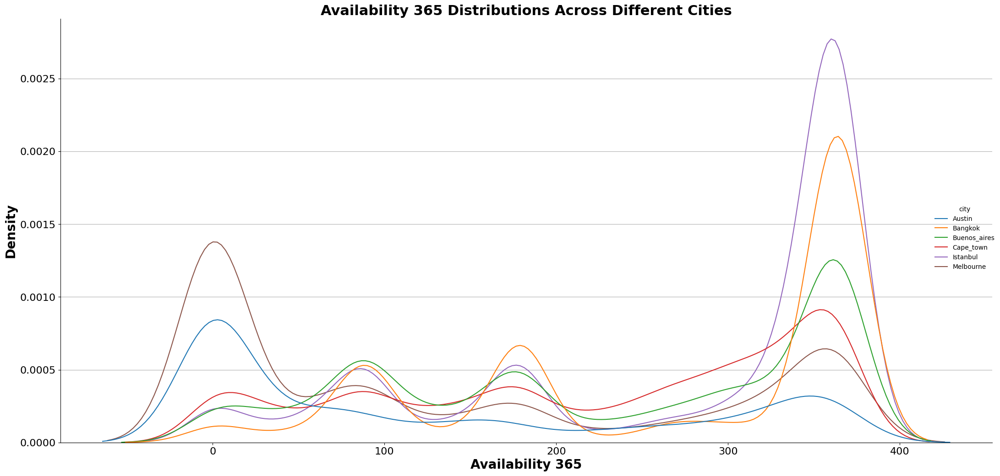

In [12]:
plt.figure(figsize=(50, 10))  # Increasing figure width for better horizontal stretch
sns.displot(listings, x="availability_365", hue="city", kind='kde', height=10, aspect=2, zorder=2)  # Adjusting aspect for wider display
plt.tight_layout()
plt.grid(axis='y', zorder=1)
plt.xlabel('Availability 365', fontsize=20, fontweight='bold')
plt.ylabel('Density', fontsize=20, fontweight='bold')
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.title("Availability 365 Distributions Across Different Cities", fontsize=22, fontweight='bold')

plt.show()

A few observations:
- Austin and Melbourne show similar distributions (both have several properties were either always available or never available) 
- Cape Town and Austin have opposite distributions.
- Bangkok and Istanbul have similar distributions (most properties are available all year)
- Buenos Aires follows a similar distribution as Bangkok and Istanbul but not as closely

**Heatmap of Availability_365 for Each City**

We will analyze a heatmap to see if there is any correlation between availability_365 and any other variables

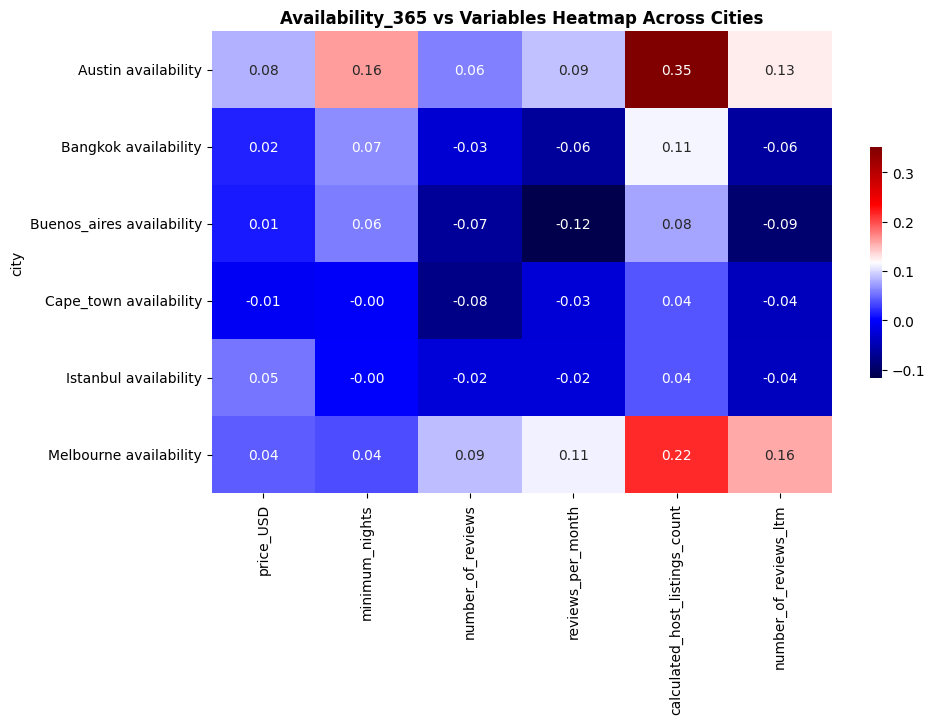

In [13]:
# Assuming 'cities' is a list of unique cities in the 'listings' dataframe
cities = listings['city'].unique()

# Initialize an empty list to store the DataFrame slices before concatenation
dataframes = []

for city in cities:
    # Filter the listings for the current city
    city_listings = listings[listings['city'] == city]
    
    columns_of_interest = ['price_USD', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'number_of_reviews_ltm', 'availability_365']
    city_listings = city_listings[columns_of_interest]
    
    # Calculate the correlation matrix for the filtered city listings
    corr_city = city_listings.corr()
    
    # Extract the row for 'availability_365' to get its correlations with other specified variables
    corr_availability = corr_city.loc[['availability_365'], columns_of_interest[:-1]]  # Exclude 'availability_365' itself
    
    # Add a column to distinguish data from different cities
    corr_availability['city'] = city + " availability"
    
    # Append the data to the list
    dataframes.append(corr_availability)

# Concatenate all DataFrame slices in the list into one DataFrame
combined_corr_data = pd.concat(dataframes)

# Set the 'city' column as the index to distinguish rows in the heatmap
combined_corr_data.set_index('city', inplace=True)

# Plot the heatmap for combined 'availability_365' correlations across all cities with specified variables
plt.figure(figsize=(10, 6))  # Adjusted figure size for better readability
sns.heatmap(combined_corr_data, annot=True, fmt=".2f", cmap='seismic', cbar_kws={'shrink': .5})
plt.title('Availability_365 vs Variables Heatmap Across Cities', fontsize=12, fontweight='bold')
plt.show()


**What the Heatmap Tells Us:**
- The variable that most strongly correlates with availability_365 (though it is not a very high one) across different cities is calculated_host_listings_count, with a positive correlation.
- Austin has the highest correlation across all variables, compared to all other cities, with the highest being a 35% correlation.
- We can also note that Istanbul and has the lowest correlation between all variables and availability_365, with most of them being negative and close to zero.

**Overall, there are no strong correlations or noticeable patterns between availability_365 and all other variables for any city**

Now, lets try some visualization techniques that aim at identifying any hidden patterns or trends.

Let's start with visualizing any relationship that might exist between price in USD and availability for each city.

## Price vs Availability

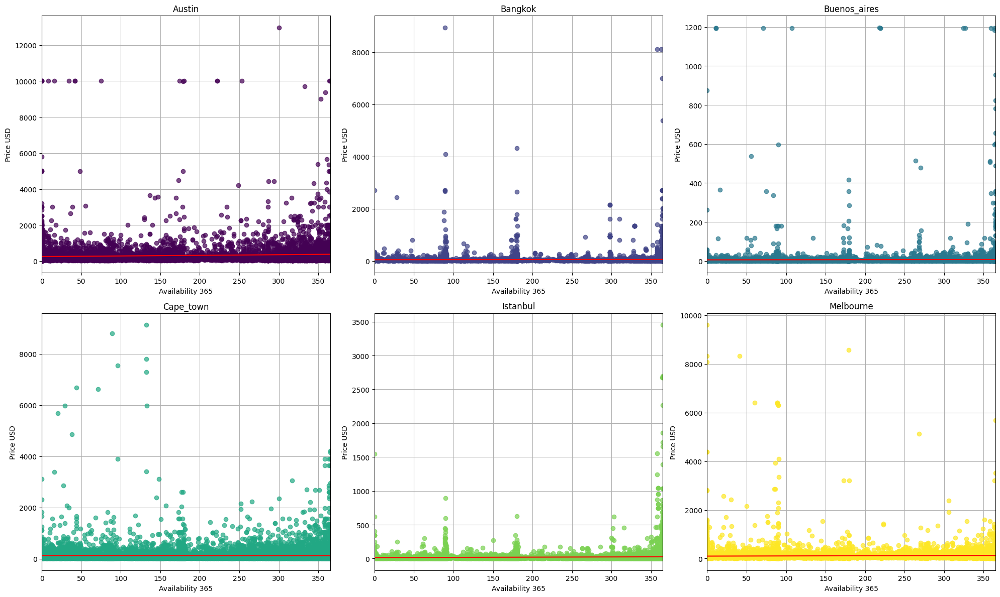

In [14]:
cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city]
    if rows == 1:
        ax = axs[col]
    else:
        ax = axs[row, col]
    
    # Plotting the scatter plot
    ax.scatter(subset["availability_365"], subset["price_USD"], color=colors[i], alpha=0.7, zorder=2)
    
    # Fitting a line of best fit
    x = subset["availability_365"]
    y = subset["price_USD"]
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    x_new = np.linspace(x.min(), x.max(), num=200)
    y_new = intercept + slope * x_new
    
    ax.plot(x_new, y_new, color="red", zorder=3)
    
    ax.set_title(str(city))
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.grid(True, zorder=1)
    ax.set_ylabel('Price USD')

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows == 1:
            axs[col].axis('off')
        else:
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()

The scatterplots do not follow any pattern, so we will take the log transformation of price.

## Log of Price vs Availability

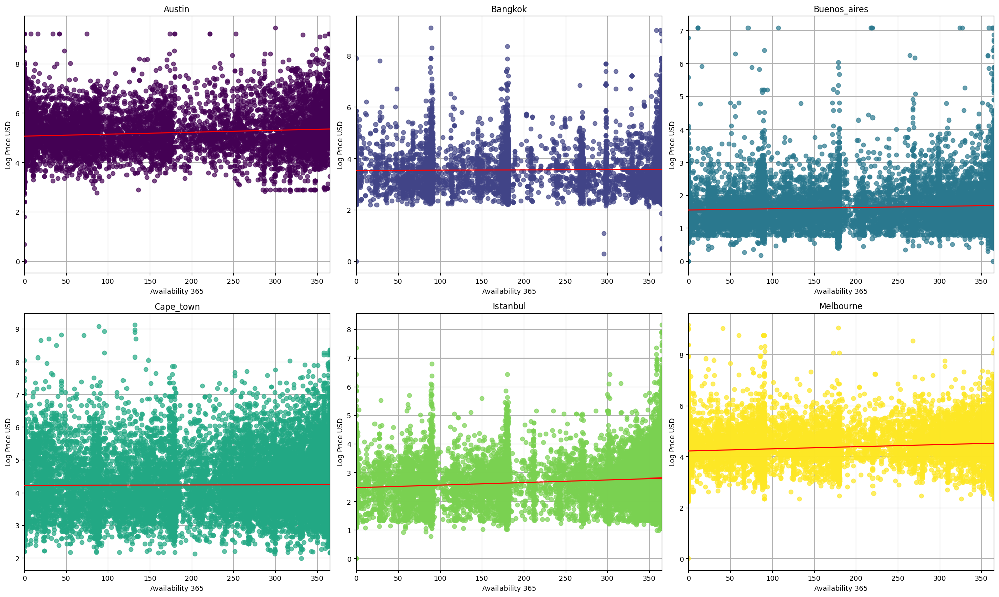

In [15]:
# Assuming 'listings' DataFrame and 'cities' list are already defined
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6 * rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city].copy()  # Make a copy when slicing to avoid SettingWithCopyWarning
    ax = axs[col] if rows == 1 else axs[row, col]

    # Applying log transformation to price_USD to normalize distribution
    subset['log_price_USD'] = np.log(subset['price_USD'] + 1)  # Adding 1 to avoid log(0)

    # Plotting the scatter plot with log transformation
    ax.scatter(subset["availability_365"], subset["log_price_USD"], color=colors[i], alpha=0.7, zorder=2)

    # Fitting a line of best fit on the log-transformed prices
    x = subset["availability_365"]
    y = subset["log_price_USD"]
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    x_new = np.linspace(x.min(), x.max(), num=200)
    y_new = intercept + slope * x_new

    ax.plot(x_new, y_new, color="red", zorder=3)

    ax.set_title(city.capitalize())
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.grid(True, zorder=1)
    ax.set_ylabel('Log Price USD')

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        if rows == 1:
            axs[idx].axis('off')
        else:
            row = idx // 3
            col = idx % 3
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()

After taking the log transformation, we can see that Austin, Istanbul, and Melbourne have a very slight positive correlation, though not significant enough. This tells us that in those cities, as availability increases, the log of the price slightly increases. More avaiable properties tend to be priced slightly higher, or people tend to go for less expensive properties in these countries.

Bangkok, Buenos Aires, and Cape Town have a straight line as the line of best fit, showing no relationship. This means that in these countries, availability will not be affected by the price.

Next, we will see if minimum nights and availability show any sort of relationship.

## Minimum Nights vs Availability 

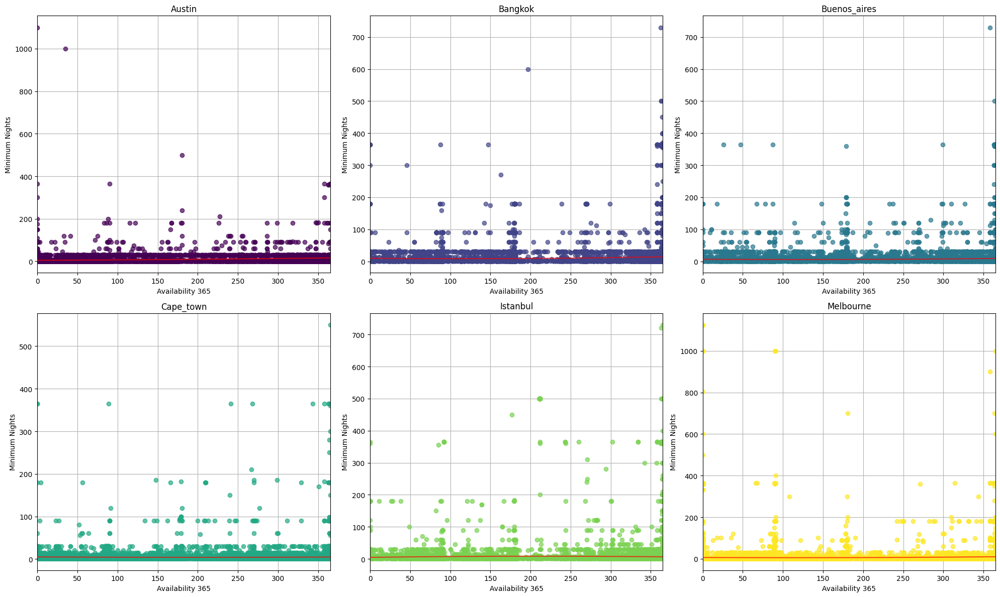

In [16]:
cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city]
    if rows == 1:
        ax = axs[col]
    else:
        ax = axs[row, col]
    
    # Fit a polynomial (let's choose a 2nd degree polynomial for demonstration)
    x = subset["availability_365"]
    y = subset["minimum_nights"]
    coefs = Polynomial.fit(x, y, 2).convert().coef  # Fit and convert to standard polynomial form
    x_new = np.linspace(x.min(), x.max(), 200)
    y_fit = np.polyval(coefs[::-1], x_new)  # Calculate the fitted y values
    
    ax.plot(x, y, 'o', color=colors[i], alpha=0.7, zorder=2)  # Original data
    ax.plot(x_new, y_fit, '-', color='red', alpha=0.7, zorder=3)  # Line of best fit
    
    ax.set_title(str(city))
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.set_ylabel('Minimum Nights')
    ax.grid(True, zorder=1)

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows == 1:
            axs[col].axis('off')
        else:
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()

There seems to be no relationship. Most properties have below fifty reviews accross all cities. This does not seem to impact the availability, as it remains the same all throughout. Lets try a log transformation.

## Log of Minimum Nights vs Availability

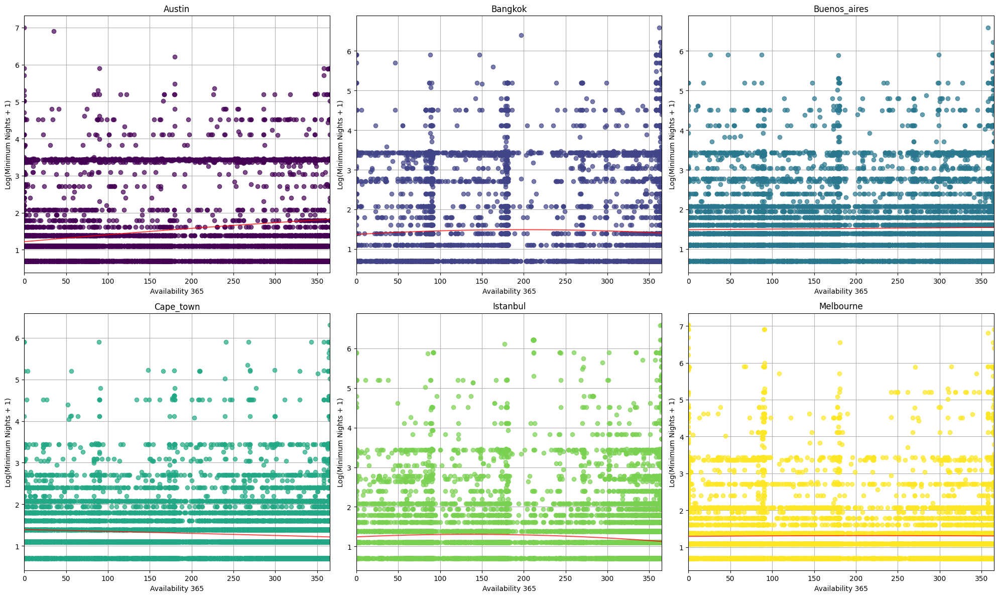

In [17]:
cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city]
    
    if rows == 1:
        ax = axs[col]
    else:
        ax = axs[row, col]
    
    # Fit a polynomial (let's choose a 2nd degree polynomial for demonstration)
    x = subset["availability_365"]
    y = np.log(subset["minimum_nights"] + 1)  # Apply log transformation to minimum_nights to handle zero values
    coefs = Polynomial.fit(x, y, 2).convert().coef  # Fit and convert to standard polynomial form
    
    x_new = np.linspace(x.min(), x.max(), 200)
    y_fit = np.polyval(coefs[::-1], x_new)  # Calculate the fitted y values
    
    ax.plot(x, y, 'o', color=colors[i], alpha=0.7, zorder=2)  # Original data
    ax.plot(x_new, y_fit, '-', color='red', alpha=0.7, zorder=3)  # Line of best fit
    
    ax.set_title(str(city))
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.set_ylabel('Log(Minimum Nights + 1)')
    ax.grid(True, zorder=1)

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows == 1:
            axs[col].axis('off')
        else:
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()

After taking the log transformation we can see that in Austin and Buenos Aires there is a very weak positive correlation. This means that requiring more minimum nights leads to properties being booked less in those cities. This means that in these countries if there is a required minimum nights, people are less likely to book. 

In Cape Town there is a slight negative correlation, meaning that there is less availability for for properties requiring more minimum nights. and in both bangkok and Istanbul it seems like we can fit a very weak second degree polynomial to the data. 

Now lets create a visual for number of reviews vs availability

## Number of Reviews vs Availability 

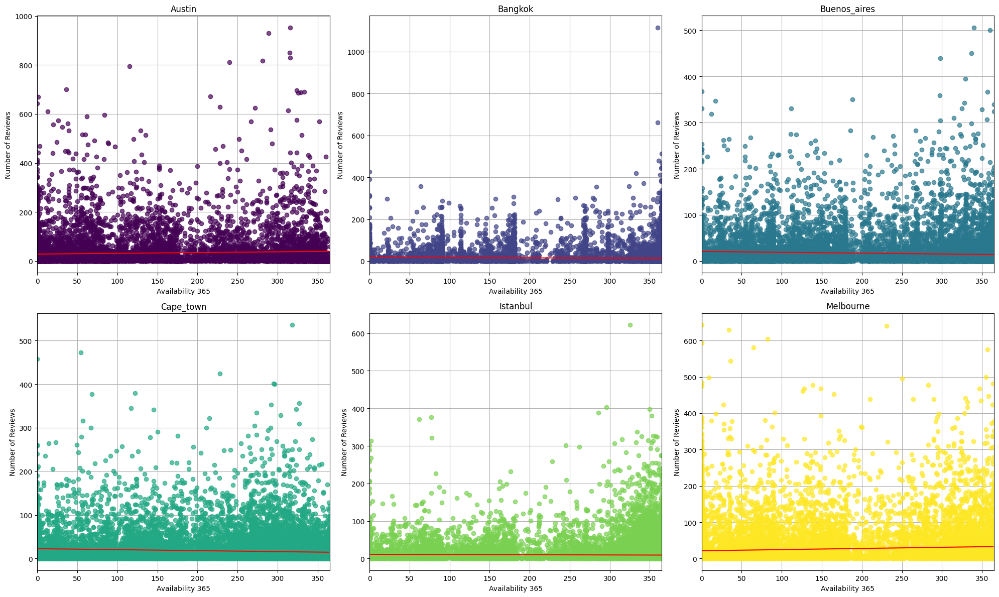

In [18]:
def linear_fit(x, a, b):
    return a * x + b

cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city]
    if rows == 1:
        ax = axs[col]
    else:
        ax = axs[row, col]
    
    # Scatter plot
    ax.scatter(subset["availability_365"], subset["number_of_reviews"], color=colors[i], alpha=0.7, zorder=2)
    
    # Fit line
    popt, _ = curve_fit(linear_fit, subset["availability_365"], subset["number_of_reviews"])
    x_line = np.arange(min(subset["availability_365"]), max(subset["availability_365"]), 1)
    y_line = linear_fit(x_line, *popt)
    ax.plot(x_line, y_line, '-', color='red')  # Line of best fit
    
    ax.set_title(str(city))
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.set_ylabel('Number of Reviews')
    ax.grid(True, zorder=1)

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows == 1:
            axs[col].axis('off')
        else:
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()

We can see that for Austin and Melbourne there is a weak positive correlation. For Cape Town and Buenos Aires there is a weak negative correlation, and for Istanbul and Bnagkok there is no correlation. Lets now take the log for further exploration.

## Log of Number of Reviews vs Availability

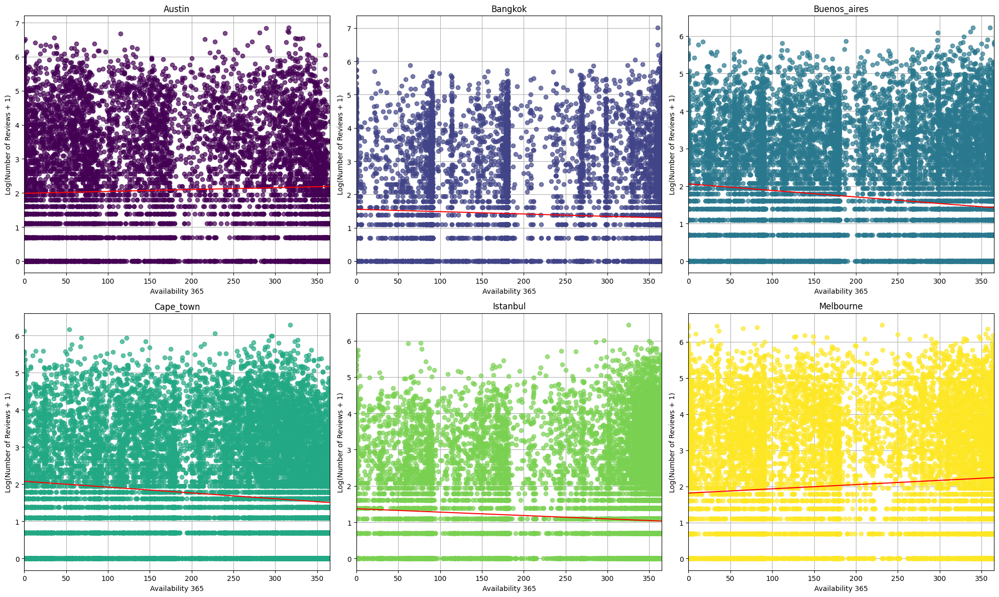

In [19]:
# Function to fit a line
def linear_func(x, a, b):
    return a * x + b

cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city]
    if rows == 1:
        ax = axs[col]
    else:
        ax = axs[row, col]
    # Taking log of 'number_of_reviews' to plot
    ax.scatter(subset["availability_365"], np.log1p(subset["number_of_reviews"]), color=colors[i], alpha=0.7, zorder=2)  # Scatter plot for each city with log scale for number of reviews
    
    # Fit a line to the data
    xdata = subset["availability_365"]
    ydata = np.log1p(subset["number_of_reviews"])
    popt, pcov = curve_fit(linear_func, xdata, ydata)
    # Plot the fitted line
    x_fit = np.linspace(xdata.min(), xdata.max(), 100)
    y_fit = linear_func(x_fit, *popt)
    ax.plot(x_fit, y_fit, '-', color='red')  # Plotting the fitted line
    
    ax.set_title(str(city))
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.set_ylabel('Log(Number of Reviews + 1)')
    ax.grid(True, zorder=1)

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows == 1:
            axs[col].axis('off')
        else:
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()

This log transformation allows us to see relationships a little more clearly. Austin and Melbourne both have a slight positive correlation, meaning that for these cities the more reviews there are, the more available a property is. This could be due to a number of facotrs such as many bad reveiews.

We can also see that Buenos Aires, Cape Town, and Istanbul have a slight negative correlation. For these cities, if there are more reviews it is most likely that the property will be booked. This could be because properties in those countries properties tend to all be highly reviewed.

Depending on the country, reviews might positively or negatively influence availability.

Next, lets plot number of reviews in the last 12 months and availability to look for any patterns

## Number of Reviews in LTM vs Availability

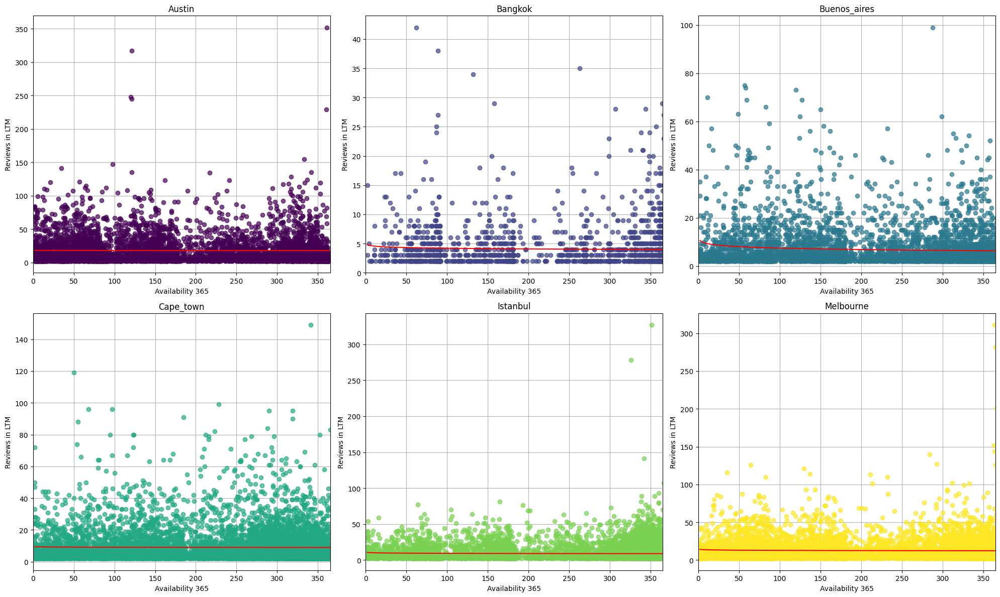

In [20]:
# Define the fitting function with log transformation
def log_linear_fit(x, a, b):
    return a * np.log(x + 1) + b  # Ensure x + 1 is strictly positive

cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)
fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    ax = axs[row, col] if rows > 1 else axs[col]
    
    subset = listings[listings['city'] == city]
    subset = subset[(subset["availability_365"] > 0) & (subset["number_of_reviews_ltm"] > 0)]  # Ensure no zero values

    x = subset["availability_365"] + 1
    y = subset["number_of_reviews_ltm"] + 1

    # Handle cases where fitting might fail
    try:
        popt, _ = curve_fit(log_linear_fit, x, y)
        x_fit = np.linspace(x.min(), x.max(), 100)
        y_fit = log_linear_fit(x_fit, *popt)
        ax.plot(x_fit, y_fit, '-', color='red', zorder=3)  # Line of best fit
    except Exception as e:
        print(f"Could not fit model for {city}: {e}")

    ax.scatter(x, y, color=colors[i], alpha=0.7, zorder=2)
    ax.set_title(city)
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.set_ylabel('Reviews in LTM')
    ax.grid(True)

# Handle empty subplots
for idx in range(len(cities), rows * 3):
    if rows == 1:
        axs[idx % 3].axis('off')
    else:
        axs[idx // 3, idx % 3].axis('off')

plt.tight_layout()
plt.show()

By looking at these plots, all cities have no relationship between reviews LTM and availability_365, except for buenos aires that has a weak negative correlation. Now lets take the log transformation.

## Log of Number of Reviews in LTM vs Availability

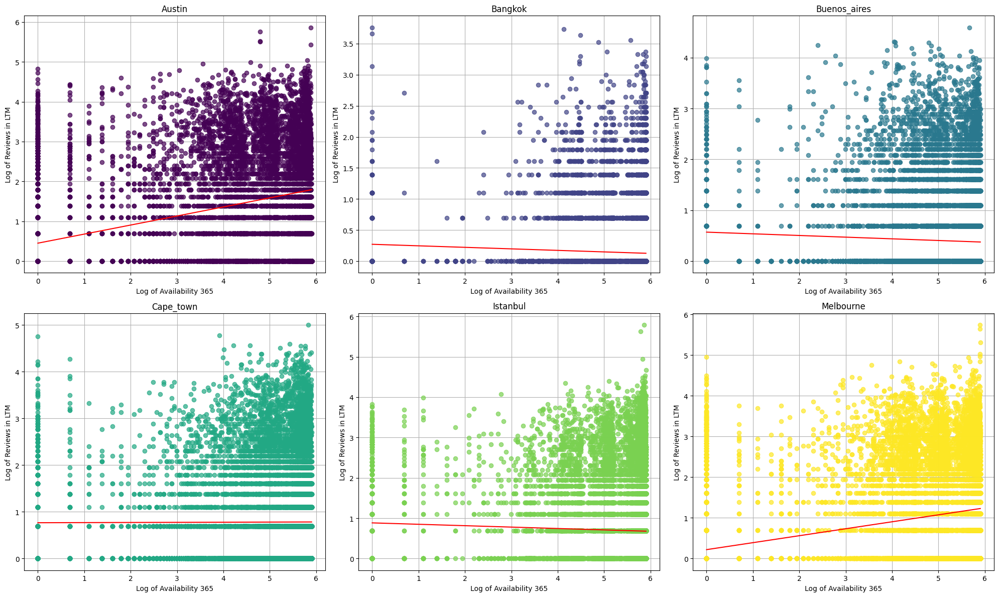

In [21]:
cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)
fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city].copy()
    ax = axs[row, col] if rows > 1 else axs[col]
    
    # Perform log transformation and add 1 to avoid log(0) issues
    x = np.log1p(subset["availability_365"])
    y = np.log1p(subset["number_of_reviews_ltm"])
    ax.scatter(x, y, color=colors[i], alpha=0.7, zorder=2)
    
    # Prepare data for OLS fit
    x_with_const = sm.add_constant(x)  # adding a constant for the intercept
    model = sm.OLS(y, x_with_const)
    results = model.fit()
    
    # Prepare data for plotting the line of best fit
    x_plot = np.linspace(min(x), max(x), 100)
    x_fit = sm.add_constant(x_plot)
    y_fit = results.predict(x_fit)
    
    # Plot the line of best fit
    ax.plot(x_plot, y_fit, '-', color='red')  # Line of best fit
    
    # Set titles and labels
    ax.set_title(city.capitalize())
    ax.set_xlabel('Log of Availability 365')
    #ax.set_xlim(0, 365)
    ax.set_ylabel('Log of Reviews in LTM')
    ax.grid(True, zorder=1)

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows > 1:
            axs[row, col].axis('off')
        else:
            axs[col].axis('off')

plt.tight_layout()
plt.show()

After taking the log, we can see that Austin and Melbourne both have positive correlations. This means that the more reviews there are in the last twelve months, the more available a property is. So, reviews do not necesseraly benefit airbnb owners.

In Buenos Aires, Bangkok, and Istanbul there is a weak negative correlation. In these cities more reviews in the last twelve months help a property get booked more.

Cape Town shows no correlation.

Now we will see if there is any noticeable pattern or relationship between calculated host listings and availability

## Calculated Hosts Listings Count vs Availability

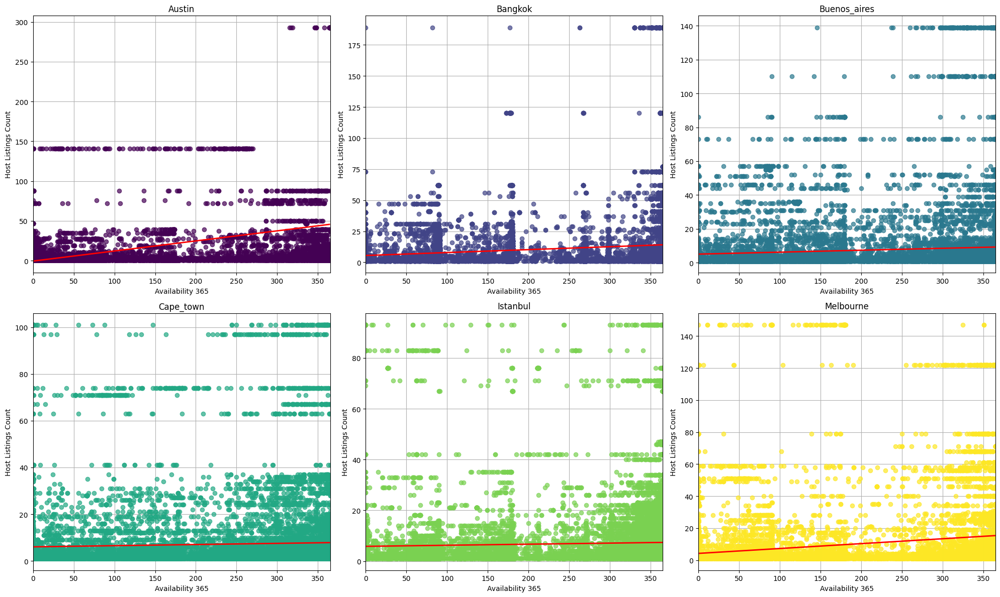

In [22]:
def linear_fit(x, a, b):
    return a * x + b

cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city]
    if rows == 1:
        ax = axs[col]
    else:
        ax = axs[row, col]
    
    # Scatter plot for each city
    ax.scatter(subset["availability_365"], subset["calculated_host_listings_count"], color=colors[i], alpha=0.7, zorder=2)
    
    # Fit line
    popt, _ = curve_fit(linear_fit, subset["availability_365"], subset["calculated_host_listings_count"])
    x_line = np.arange(min(subset["availability_365"]), max(subset["availability_365"]), 1)
    y_line = linear_fit(x_line, *popt)
    ax.plot(x_line, y_line, color="red", linewidth=2)  # Line of best fit
    
    ax.set_title(str(city))
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.set_ylabel('Host Listings Count')
    ax.grid(True, zorder=1)

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows == 1:
            axs[col].axis('off')
        else:
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()

Bangkok, Buenos Aires, and Cape Town all show weak positive correlations. Melbourne and Austin show slightly stronger positive correlations. Istanbul shows almost no correlation. Lets take the log now.

## Log of Calculated Hosts Listings Count vs Availability

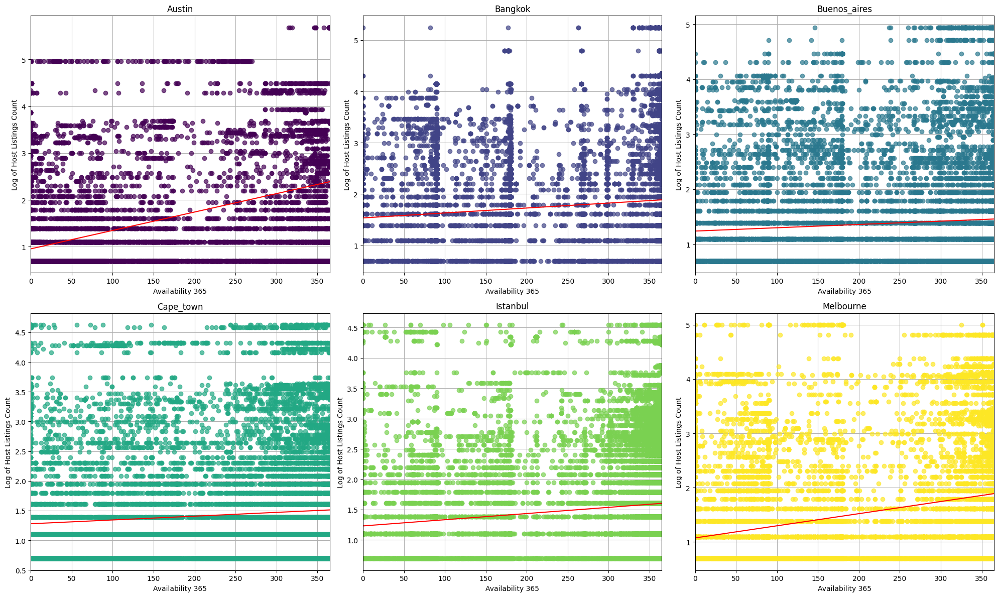

In [23]:
# Define a linear function for curve fitting
def linear_func(x, a, b):
    return a * x + b

cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city]
    if rows == 1:
        ax = axs[col]
    else:
        ax = axs[row, col]
    
    # Taking the log of the y variable
    y_log = np.log(subset["calculated_host_listings_count"] + 1)  # Adding 1 to avoid log(0)
    
    # Plotting the original data with log transformation
    ax.scatter(subset["availability_365"], y_log, color=colors[i], alpha=0.7, zorder=2)
    
    # Perform curve fitting on the log-transformed data
    popt, pcov = curve_fit(linear_func, subset["availability_365"], y_log)
    
    # Generate x values for the fitted line
    x_fit = np.linspace(subset["availability_365"].min(), subset["availability_365"].max(), 100)
    # Generate y values for the fitted line using the fitted parameters
    y_fit = linear_func(x_fit, *popt)
    
    # Plot the fitted line
    ax.plot(x_fit, y_fit, '-', color='red')
    
    ax.set_title(str(city))
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.set_ylabel('Log of Host Listings Count')
    ax.grid(True, zorder=1)

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows == 1:
            axs[col].axis('off')
        else:
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()

After taking the log transformation, we can see that in all the cities hosts with a higher lsiting count have more availability across properties. 

Austin and Melbourne have the strongest positive correlation.

## Reviews Per Month vs Availability

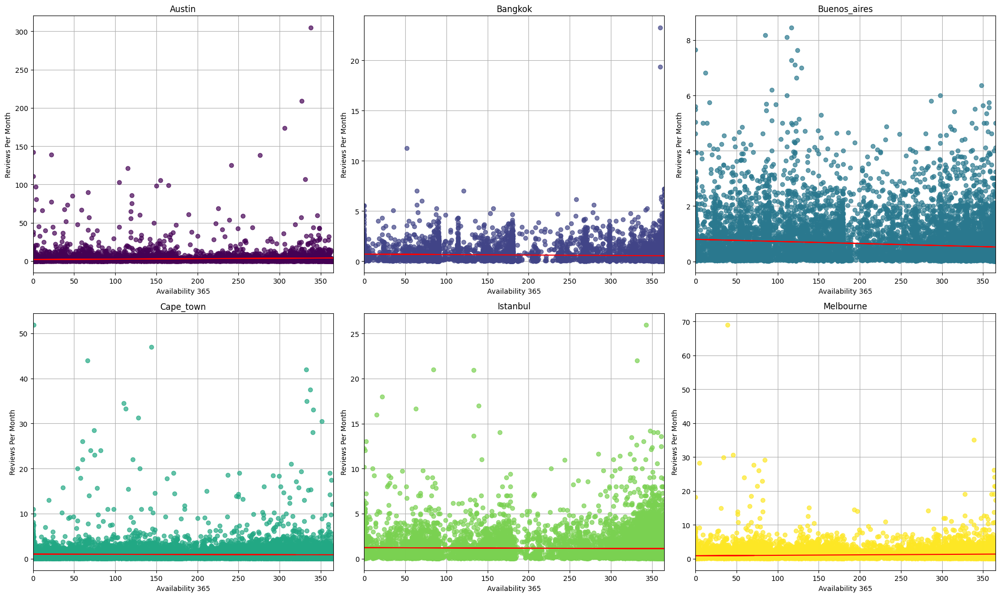

In [24]:
def linear_fit(x, a, b):
    return a * x + b

cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city]
    x = subset["availability_365"]
    y = subset["reviews_per_month"]
    
    # Remove NaN values from x and y
    mask = ~np.isnan(x) & ~np.isnan(y)
    x = x[mask]
    y = y[mask]
    
    # Fit a linear model
    popt, _ = curve_fit(linear_fit, x, y)
    
    if rows == 1:
        ax = axs[col]
    else:
        ax = axs[row, col]
    ax.plot(x, y, 'o', color=colors[i], alpha=0.7, zorder=2)  # Dot plot for each city
    ax.plot(x, linear_fit(x, *popt), '-', color='red')  # Line of best fit
    
    ax.set_title(str(city))
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.set_ylabel('Reviews Per Month')
    ax.grid(True, zorder=1)

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows == 1:
            axs[col].axis('off')
        else:
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()

Austin, Bangkok, Cape Town, Istanbul, and Melbourne all have almost no correlations. However, Buenos Aires has a weak but notcable negative correlation. Now let's take the log.

## Log of Reviews Per Month vs Availability

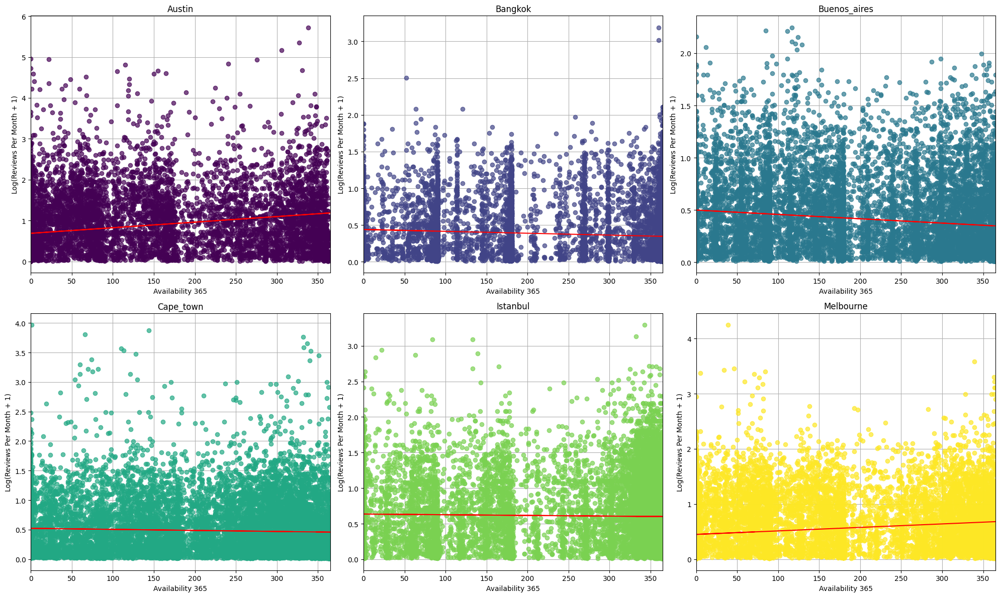

In [25]:
def linear_fit(x, a, b):
    return a * x + b

cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city]
    x = subset["availability_365"]
    y = subset["reviews_per_month"]
    
    # Taking log of y to fit a linear model on transformed data
    y_log = np.log(y + 1)  # Adding 1 to avoid log(0)
    
    # Remove NaN values from x and y_log
    mask = ~np.isnan(x) & ~np.isnan(y_log)
    x = x[mask]
    y_log = y_log[mask]
    
    # Fit a linear model on log-transformed y
    popt, _ = curve_fit(linear_fit, x, y_log)
    
    if rows == 1:
        ax = axs[col]
    else:
        ax = axs[row, col]
    ax.plot(x, y_log, 'o', color=colors[i], alpha=0.7, zorder=2)  # Dot plot for each city
    ax.plot(x, linear_fit(x, *popt), '-', color='red')  # Line of best fit on log-transformed y
    
    ax.set_title(str(city))
    ax.set_xlabel('Availability 365')
    ax.set_xlim(0, 365)
    ax.set_ylabel('Log(Reviews Per Month + 1)')
    ax.grid(True, zorder=1)

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows == 1:
            axs[col].axis('off')
        else:
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()


After taking the log transformation, we can see that in Austin and Bangkok hosts with a higher listing count have more availability across properties. 

We can see that in Buenos Aires hosts with a higher listing count have less availability across properties.

Bangkok, Cape Town and Istanbul show no correlation.

# Diving Into Our Observations

After analyzing our dot plots, we observed that Austin and Melbourne behave similarly across all fields. Bangkok, Buenos Aires, and Cape Town have somewhat similar patterns, and Istanbul behaves uniquely compared to all other cities. 

Let's analyze these similarities further:

**More Visualization Showing Similarities Between Cities**

Below is a bar graph illustrating availability_365 vs number of listings accross different cities.

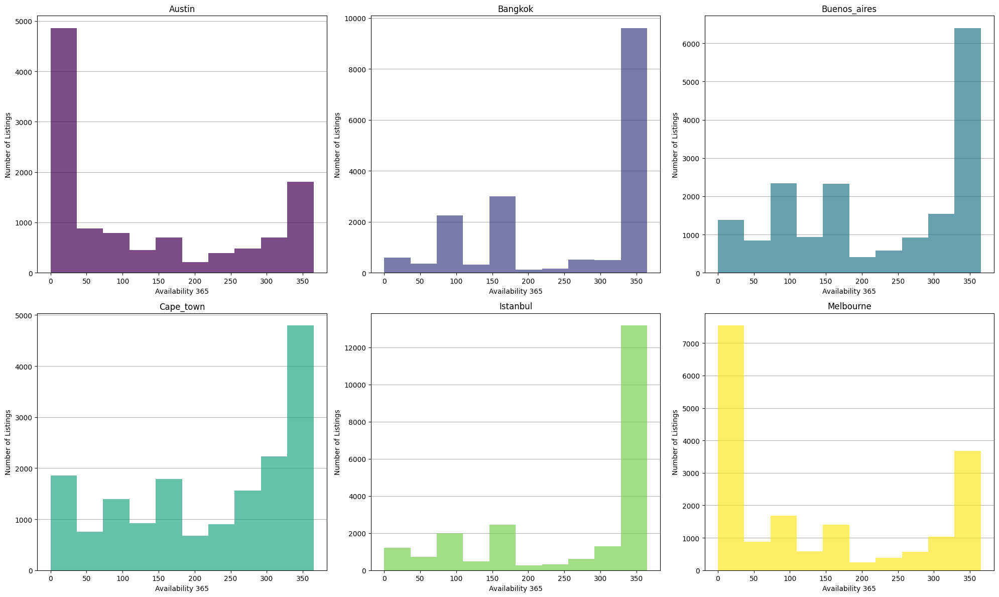

In [26]:
cities = listings['city'].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(cities)))  # Generating a color map

# Calculate rows needed for 3 cities per row
rows = len(cities) // 3 + (1 if len(cities) % 3 else 0)

fig, axs = plt.subplots(rows, 3, figsize=(20, 6*rows))

for i, city in enumerate(cities):
    row = i // 3
    col = i % 3
    subset = listings[listings['city'] == city]
    if rows == 1:
        ax = axs[col]
    else:
        ax = axs[row, col]
    ax.hist(subset["availability_365"], alpha=0.7, color=colors[i], zorder=2)  # Histogram for each city
    
    ax.set_title(str(city))
    ax.set_xlabel('Availability 365')
    ax.grid(axis='y', zorder=1)
    ax.set_ylabel('Number of Listings')

# Hide empty subplots if cities count is not a multiple of 3
if len(cities) % 3:
    for idx in range(len(cities), rows * 3):
        row = idx // 3
        col = idx % 3
        if rows == 1:
            axs[col].axis('off')
        else:
            axs[row, col].axis('off')

plt.tight_layout()
plt.show()

We can see that Austin and Melbourne follow an almost identical distribution, while Bangkok, Buenos Aires, Cape Town, and Istanbul all have similar distributions. 

Lets observe the correlation between the total number of listings and availability

/tmp/ipykernel_50/717824663.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='city', y='correlation', data=correlation_df, palette='husl', zorder=2)


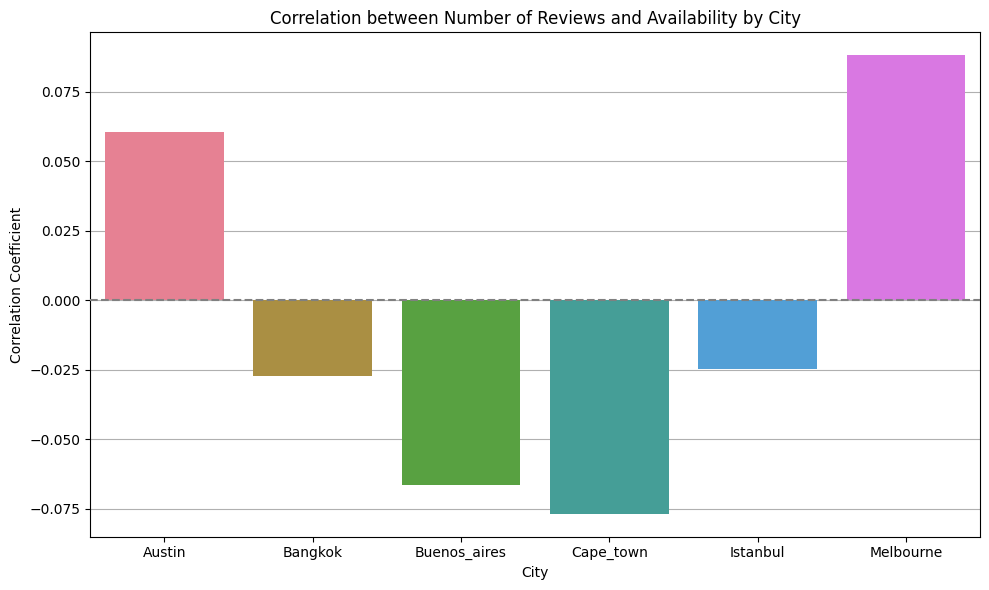

In [27]:
# Calculate correlation for each city
correlations = []
for city in listings['city'].unique():
    city_data = listings[listings['city'] == city]
    correlation = city_data[['number_of_reviews', 'availability_365']].corr().iloc[0, 1]
    correlations.append({'city': city, 'correlation': correlation})

# Convert list to DataFrame
correlation_df = pd.DataFrame(correlations)

# Plotting the bar chart
plt.figure(figsize=(10, 6))
# Updated the plotting code with a minor change for clarity and compatibility
sns.barplot(x='city', y='correlation', data=correlation_df, palette='husl', zorder=2)
plt.title('Correlation between Number of Reviews and Availability by City')
plt.xlabel('City')
plt.ylabel('Correlation Coefficient')
plt.grid(axis='y', zorder=1)
plt.axhline(0, color='gray', linestyle='--', zorder=3)
plt.tight_layout()
plt.show()


This shows us that only Austin and Melbourne have a positive correlation between the number of reviews and the availabilty. All other cities have a negative correlation. Tying this back to the bar graph above, we can see that cities can be placed in two groups based on similarities. Austin and Melbourne would be grouped together, while all the remaining cities would be placed in the second group.

/tmp/ipykernel_50/1595484408.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='city', y='average_price', data=avg_price_availability, ax=ax[0], palette='husl', zorder=2)
/tmp/ipykernel_50/1595484408.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='city', y='average_availability_365', data=avg_price_availability, ax=ax[1], palette='husl', zorder=2)


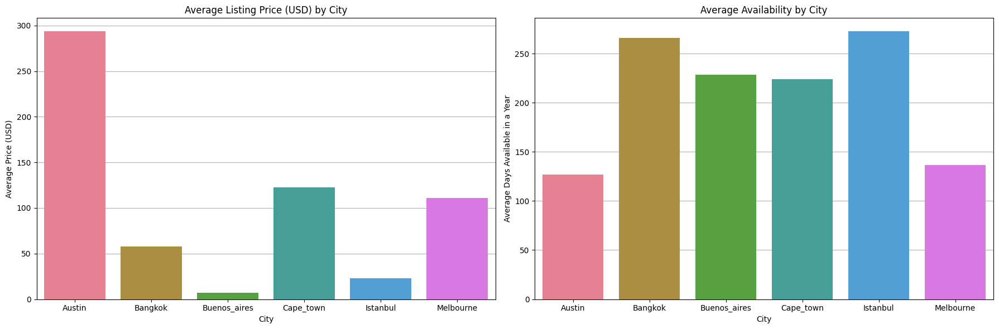

In [28]:
# Ensure city is treated as a category with observed categories only if needed
listings['city'] = listings['city'].astype('category')

# Compute average price and availability per city
avg_price_availability = listings.groupby('city', observed=True).agg(
    average_price=('price_USD', 'mean'),
    average_availability_365=('availability_365', 'mean')
).reset_index()

# Plotting the data
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

# Average Price by City
sns.barplot(x='city', y='average_price', data=avg_price_availability, ax=ax[0], palette='husl', zorder=2)
ax[0].set_title('Average Listing Price (USD) by City')
ax[0].set_ylabel('Average Price (USD)')
ax[0].set_xlabel('City')
ax[0].grid(axis='y', zorder=1)

# Average Availability by City
sns.barplot(x='city', y='average_availability_365', data=avg_price_availability, ax=ax[1], palette='husl', zorder=2)
ax[1].set_title('Average Availability by City')
ax[1].set_ylabel('Average Days Available in a Year')
ax[1].set_xlabel('City')
ax[1].grid(axis='y', zorder=1)

plt.tight_layout()
plt.show()

Above shows the Average Listing Prices (USD) and Average Availability by City as an alternative way to view the data. This can also provide further insight to the relationship between Austin and Melbourne when compared to the other cities. We can see that the more expensive listings are found in Austin, Melbourne, and Cape Town. Furthermore we can observe that Austin and Melbourne have the least amount of availability while the other cities are far more available.

## Model 1 - Pairgrid Univariate Distribution Between Cities

In [29]:
# Assuming listings is already loaded and prepared

# One-hot encode the 'city' column
encoder = OneHotEncoder(drop='first', sparse=False)
city_encoded = encoder.fit_transform(listings[['city']])
city_encoded_df = pd.DataFrame(city_encoded, columns=encoder.get_feature_names_out(['city']))

# Reset the index on both the original and encoded DataFrames to ensure alignment
listings.reset_index(drop=True, inplace=True)
city_encoded_df.reset_index(drop=True, inplace=True)

# Now create the mask for rows with any missing values in the cleaned listings DataFrame
missing_rows = listings.isnull().any(axis=1)

# Apply the missing data mask to both DataFrames
listings_cleaned = listings.loc[~missing_rows]
city_encoded_cleaned = city_encoded_df.loc[~missing_rows]

# Concatenate the cleaned and encoded DataFrames
listings_encoded = pd.concat([listings_cleaned.drop(columns=['city']), city_encoded_cleaned], axis=1)

# Define predictors including the new city columns
predictors = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 
              'calculated_host_listings_count', 'number_of_reviews_ltm']

# Define the independent variables (X) and the dependent variable (y)
X = listings_encoded.loc[:, predictors]
y = listings_encoded['availability_365']

# Add a constant to the model (intercept)
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()

# Get the summary of the regression
summary = model.summary()

# Extracting the parameters from the model excluding the intercept
params = model.params[1:]  # Exclude the intercept
conf1 = model.conf_int().loc[predictors]  # Get confidence interval for predictors
conf1['coef'] = params

# Plot
conf1.columns = ['2.5%', '97.5%', 'coef']
conf1 = conf1.sort_values('coef')

plt.figure(figsize=(10, 8))
plt.errorbar(conf1.index, conf1['coef'], yerr=[conf1['coef'] - conf1['2.5%'], conf1['97.5%'] - conf1['coef']], fmt='o', zorder=3)
plt.title('Multiple Linear Regression Coefficients with Various Predictors')
#plt.axhline(y=0, linestyle='--', color='red', linewidth=1, zorder=2)
plt.xticks(rotation=45)  # Rotate labels to avoid overlap
plt.tight_layout()
plt.ylabel('Regression Coefficients')
plt.xlabel('Variable Names')
plt.grid(axis='y', zorder=1)

labels = plt.gca().get_xticklabels()
for label in labels:
    label.set_horizontalalignment('right')

TypeError: OneHotEncoder.__init__() got an unexpected keyword argument 'sparse'

Here we can see that the Calculated Host Listings Count has the strongest effects on the linear regression models, meaning that it will have the most influence over these models and will generally increase the predicted value (Availability over 365 days) as it increases. Furthermore, Reviews per Month has the most negative value meaning that as it increases the predicted value will tend to decrease.

In [ ]:
# Assuming listingz is already loaded and prepared

# One-hot encode the 'city' column
encoder = OneHotEncoder(drop='first', sparse=False)
city_encoded = encoder.fit_transform(listingz[['city']])
city_encoded_df = pd.DataFrame(city_encoded, columns=encoder.get_feature_names_out(['city']))

# Reset the index on both the original and encoded DataFrames to ensure alignment
listingz.reset_index(drop=True, inplace=True)
city_encoded_df.reset_index(drop=True, inplace=True)

# Now create the mask for rows with any missing values in the cleaned listingz DataFrame
missing_rows = listingz.isnull().any(axis=1)

# Apply the missing data mask to both DataFrames
listingz_cleaned = listingz.loc[~missing_rows]
city_encoded_cleaned = city_encoded_df.loc[~missing_rows]

# Concatenate the cleaned and encoded DataFrames
listingz_encoded = pd.concat([listingz_cleaned.drop(columns=['city']), city_encoded_cleaned], axis=1)

# Define predictors including the new city columns
predictors = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 
              'calculated_host_listings_count', 'number_of_reviews_ltm']

# Define the independent variables (X) and the dependent variable (y)
X = listingz_encoded.loc[:, predictors]
y = listingz_encoded['availability_365']

# Add a constant to the model (intercept)
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()

# Get the summary of the regression
summary = model.summary()

# Extracting the parameters from the model excluding the intercept
params = model.params[1:]  # Exclude the intercept
conf2 = model.conf_int().loc[predictors]  # Get confidence interval for predictors
conf2['coef'] = params

# Plot
conf2.columns = ['2.5%', '97.5%', 'coef']
conf2 = conf2.sort_values('coef')

plt.figure(figsize=(10, 8))
plt.errorbar(conf2.index, conf2['coef'], yerr=[conf2['coef'] - conf2['2.5%'], conf2['97.5%'] - conf2['coef']], fmt='o', zorder=3)
plt.title('Multiple Linear Regression Coefficients with Various Predictors (Z-Score Normalized)')
#plt.axhline(y=0, linestyle='--', color='red', linewidth=1, zorder=2)
plt.xticks(rotation=45)  # Rotate labels to avoid overlap
plt.tight_layout()
plt.ylabel('Regression Coefficients')
plt.xlabel('Variable Names')
plt.grid(axis='y', zorder=1)

labels = plt.gca().get_xticklabels()
for label in labels:
    label.set_horizontalalignment('right')

Here we can see that the Z-Score Normalization has greatly decreased the effects that each of the individual variables will have on the predicted value, reducing the disparity of how much influence each variable has.

In [ ]:
# Assuming listings_norm is already loaded and prepared

# One-hot encode the 'city' column
encoder = OneHotEncoder(drop='first', sparse=False)
city_encoded = encoder.fit_transform(listings_norm[['city']])
city_encoded_df = pd.DataFrame(city_encoded, columns=encoder.get_feature_names_out(['city']))

# Reset the index on both the original and encoded DataFrames to ensure alignment
listings_norm.reset_index(drop=True, inplace=True)
city_encoded_df.reset_index(drop=True, inplace=True)

# Now create the mask for rows with any missing values in the cleaned listings_norm DataFrame
missing_rows = listings_norm.isnull().any(axis=1)

# Apply the missing data mask to both DataFrames
listings_norm_cleaned = listings_norm.loc[~missing_rows]
city_encoded_cleaned = city_encoded_df.loc[~missing_rows]

# Concatenate the cleaned and encoded DataFrames
listings_norm_encoded = pd.concat([listings_norm_cleaned.drop(columns=['city']), city_encoded_cleaned], axis=1)

# Define predictors including the new city columns
predictors = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 
              'calculated_host_listings_count', 'number_of_reviews_ltm']

# Define the independent variables (X) and the dependent variable (y)
X = listings_norm_encoded.loc[:, predictors]
y = listings_norm_encoded['availability_365']

# Add a constant to the model (intercept)
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()

# Get the summary of the regression
summary = model.summary()

# Extracting the parameters from the model excluding the intercept
params = model.params[1:]  # Exclude the intercept
conf = model.conf_int().loc[predictors]  # Get confidence interval for predictors
conf['coef'] = params

# Plot
conf.columns = ['2.5%', '97.5%', 'coef']
conf = conf.sort_values('coef')

plt.figure(figsize=(10, 8))
plt.errorbar(conf.index, conf['coef'], yerr=[conf['coef'] - conf['2.5%'], conf['97.5%'] - conf['coef']], fmt='o', zorder=3)
plt.title('Multiple Linear Regression Coefficients with Various Predictors (Min-Max Normalized)')
#plt.axhline(y=0, linestyle='--', color='red', linewidth=1, zorder=2)
plt.xticks(rotation=45)  # Rotate labels to avoid overlap
plt.tight_layout()
plt.ylabel('Regression Coefficients')
plt.xlabel('Variable Names')
plt.grid(axis='y', zorder=1)

labels = plt.gca().get_xticklabels()
for label in labels:
    label.set_horizontalalignment('right')

Here we can see the effects of the Min-Max Normalization. Notice how the margins of error are larger due to this normalization method being less robust in handling outliers, while also not deceaseing the influence of the variables as much as the Z-Score method.

In [ ]:
# Increase the default font sizes and figure size using rcParams
plt.rcParams.update({'font.size': 14, 'axes.titlesize': 16, 'axes.labelsize': 14, 'xtick.labelsize': 12, 'ytick.labelsize': 12})

# Assuming 'conf1', 'conf2', and 'conf' are your DataFrames for the plots

# Setup the figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(36, 12))  # Increased figure size

# Collect all minimum and maximum values from the confidence intervals
all_data = [conf1, conf2, conf]
min_y = min([df['2.5%'].min() for df in all_data])
max_y = max([df['97.5%'].max() for df in all_data])

# Plot 1: Using listings DataFrame
axes[0].errorbar(conf1.index, conf1['coef'], yerr=[conf1['coef'] - conf1['2.5%'], conf1['97.5%'] - conf1['coef']], fmt='o', zorder=3)
axes[0].set_xticklabels(conf1.index, rotation=45, ha='right')
axes[0].set_title('Listings: Multiple Linear Regression Coefficients')
axes[0].set_ylabel('Regression Coefficients')
axes[0].set_xlabel('Variable Names')
axes[0].set_ylim([min_y, max_y])
axes[0].grid(True, zorder=1)

# Plot 2: Using listingz DataFrame
axes[1].errorbar(conf2.index, conf2['coef'], yerr=[conf2['coef'] - conf2['2.5%'], conf2['97.5%'] - conf2['coef']], fmt='o', zorder=3)
axes[1].set_xticklabels(conf2.index, rotation=45, ha='right')
axes[1].set_title('Listingz: Multiple Linear Regression Coefficients')
axes[1].set_ylabel('Regression Coefficients')
axes[1].set_xlabel('Variable Names')
axes[1].set_ylim([min_y, max_y])
axes[1].grid(True, zorder=1)

# Plot 3: Using listings_norm DataFrame
axes[2].errorbar(conf.index, conf['coef'], yerr=[conf['coef'] - conf['2.5%'], conf['97.5%'] - conf['coef']], fmt='o', zorder=3)
axes[2].set_xticklabels(conf.index, rotation=45, ha='right')
axes[2].set_title('Listings_norm: Multiple Linear Regression Coefficients')
axes[2].set_ylabel('Regression Coefficients')
axes[2].set_xlabel('Variable Names')
axes[2].set_ylim([min_y, max_y])
axes[2].grid(True, zorder=1)

plt.tight_layout()  # Adjust layout to make room for all subplots
plt.show()

Here is all three side by side, notice how price appears to have little effect on the availability.

# Predicting Availability

## Model 2 - Linear Regression

Let's try modeling availability different models with our six predictors: mininmum number of nights, number of reviews, reviews per month, host listing count, number of reviews in the last twelve months, and the price in USD

Using Linear Regression, a 20% testing set, and all of our predictors. We get a root mean square error of 135.69 which means the model is very inaccurate.

In [ ]:
# drop null values
listings = listings.dropna()
listings_norm = listings_norm.dropna()
# listings.head() - assuming listings is a DataFrame
# declare X and y
X = listings_norm[['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'number_of_reviews_ltm', 'price_USD']] #X = listings_norm.iloc[:,[7,8,9,10,12,13]].values # min nights, # of reviews, #reviews
y = listings['availability_365'] #y = listings.iloc[:, 11].values # Availibility 


#Create training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
#Create the regressor: reg
reg = LinearRegression()
#Fit the regressor to the training data
reg.fit(X_train, y_train)
# Predict on the test data: y_pred
y_pred = reg.predict(X_test)
# Compute and print RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error: {}".format(rmse))

Applying Ridge and Lasso to data and hyper tuning by finding best alplha values

In [ ]:
#Define the regression_model_cv function, which takes a fitted model as one parameter. 
# The k = 5 hyperparameter gives the number of folds.
def regression_model_cv(model, k=5):
    scores = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=k)
    rmse = np.sqrt(-scores)
    print('Reg rmse:', rmse)
    print('Reg mean:', rmse.mean ())

print("linear Regression with best K value")
# k = 8 is the best fit gives RME of 203
regression_model_cv(LinearRegression(), k=3) # 138

print("Ridge Output")
regression_model_cv(Ridge())

print("Lasso Output")
regression_model_cv(Lasso())

# Ridge = 140.44
# Ridge Gives 248 which is worse so no overfitting?
#hyperparameter tuning
grid = dict()
grid['alpha'] = np.arange(0.01, 500, .1)
n_folds=5
# define search
search = GridSearchCV(Lasso(), grid, scoring='neg_mean_squared_error', cv=n_folds, n_jobs=-1)
# perform the search
results = search.fit(X, y)
#output results for best fit
k = search.best_params_
print("Best alpha Lasso: {}".format(k))
score = search.best_score_
rsm = np.sqrt(-score)
print("Best score: {}".format(rsm))

grid = dict()
grid['alpha'] = np.arange(0.01, 500, .1)
n_folds=5
# define search
search = GridSearchCV(Ridge(), grid, scoring='neg_mean_squared_error', cv=n_folds, n_jobs=-1)
# perform the search
results = search.fit(X, y)
#output results for best fit
k = search.best_params_
print("Best alpha for Ridge: {}".format(k))
score = search.best_score_
rsm = np.sqrt(-score)
print("Best score: {}".format(rsm))


## Model 3 - K Nearest Neighbors

Using K nearest neighbors we found the best fit k value to be 20 but it did not perform better than the standard linear regression.

In [ ]:
print("K=4")
regression_model_cv(KNeighborsRegressor(n_neighbors=4))
print("K=7")
regression_model_cv(KNeighborsRegressor(n_neighbors=7))
print("K=10")
regression_model_cv(KNeighborsRegressor(n_neighbors=10))

#Best n = 20 score = 140.79
neighbors = np.linspace(1, 20, 20)
k = neighbors.astype(int)
param_grid = {'n_neighbors': k}
knn = KNeighborsRegressor()
knn_tuned = GridSearchCV(knn, param_grid, cv=5, scoring='neg_mean_squared_error')
knn_tuned.fit(X, y)
k = knn_tuned.best_params_
print("Best n_neighbors: {}".format(k))
score = knn_tuned.best_score_
rsm = np.sqrt(-score)
print("Best score: {}".format(rsm))


## Model 4 - Decision Tree and Random Forest

Applying Decision Tree and Random Forest models lead to no better results. Leaving our best performing model the linear regression model.

In [ ]:
print("Decision Tree Output:")
regression_model_cv(tree.DecisionTreeRegressor())

print("Random Forest Output:")
regression_model_cv(RandomForestRegressor(n_jobs=-1, n_estimators=100))

param_grid = {'max_depth': [None, 10, 30, 50, 70, 100, 200, 400],
             'min_samples_split': [2, 3, 4, 5],
             'min_samples_leaf': [1, 2, 3],
             'max_features': ['sqrt', 'log2']}
reg = RandomForestRegressor(n_jobs = -1)
reg_tuned = RandomizedSearchCV(reg, param_grid, cv=5, scoring='neg_mean_squared_error')
reg_tuned.fit(X, y)
p = reg_tuned.best_params_
print("Best tuned params: {}".format(p))
score = reg_tuned.best_score_
rsm = np.sqrt(-score)
print("Best score: {}".format(rsm))
# Setup the hyperparameter grid
print("Decision Tree Tuned Parameters Output:")
regression_model_cv(RandomForestRegressor(n_jobs=-1, n_estimators=100))


## Model 5 - Logistic Regression

Let's take a different approach and make availibility a binary value. To define this value we will define available = 0 when availability_365 = 0 and available = 1 when availability_365 != 0 then fit that to a logisitc regression model. 

In [ ]:
listings['available'] = listings['availability_365'].apply(lambda x: 0 if x == 0 else 1)
listings.head()

Using Logistic Regression with the same six predictors gives us an overall accuracy of 90%. We can see that some of the cities vary from 74% accurate to 97% implying that the cities have some instrinsic characterisitic causing it. We also have an average accuracy across all cities of 90.23%

In [ ]:
listings = listings.dropna()
cities = listings['city'].unique()
def clf_model_per_city(model, X, y, city_name):
    clf = model
    scores = cross_val_score(clf, X, y)
    print(f'City: {city_name}')
    print('Scores:', scores)
    print('Mean score:', scores.mean())
    print('---' * 10)

for city in cities:
    city_listings = listings[listings['city'] == city]
    X_city = city_listings[['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'number_of_reviews_ltm', 'price_USD']] 
    y_city = city_listings['available']
    clf_model_per_city(LogisticRegression(max_iter=1000), X_city, y_city, city)
    
    

Let's see the individual weight of these predictors logarithmically individually and make a better logistic regression model.

We will analyze the logreg coefficients to build a reduced model with the best four predictors.

In [ ]:
y_train_binary = [0 if a == 0 else 1 for a in y_train]
y_test_binary = [0 if a == 0 else 1 for a in y_test]
logreg = LogisticRegression().fit(X_train, y_train_binary)
temp_list = list(logreg.feature_names_in_ [abs(logreg.coef_[0]) > 1e-2])
logreg_reduced = LogisticRegression().fit(X_train[temp_list], y_train_binary)

# Create available
y_train_binary = [0 if a == 0 else 1 for a in y_train]
y_test_binary = [0 if a == 0 else 1 for a in y_test]

# Logistic Regression Model
#logreg = LogisticRegression().fit(X_train, y_train_binary)
print('For Logistic Regression: \n',
      '- Features:', len(logreg.feature_names_in_), '\n',
      classification_report(logreg.predict(X_test), y_test_binary))

# View its features and coefficients
pd.DataFrame({'logreg_features': logreg_reduced.feature_names_in_, 
              'logreg_coeff': logreg_reduced.coef_[0]}).sort_values('logreg_coeff', ascending=False)

number_of_reviews_ltm, calculated_host_listings_count, minimum_nights, and reviews_per_month all have the highest coefficients, so these will be used as the predictors for our reduced model.

After dropping the number of reviews and the price in USD we now have an improved accuracy of 90.66%

In [ ]:
listings = listings.dropna()
cities = listings['city'].unique()
def clf_model_per_city(model, X, y, city_name):
    clf = model
    scores = cross_val_score(clf, X, y)
    print(f'City: {city_name}')
    print('Scores:', scores)
    print('Mean score:', scores.mean())
    print('---' * 10)

for city in cities:
    city_listings = listings[listings['city'] == city]
    X_city = city_listings[['minimum_nights', 'reviews_per_month', 'calculated_host_listings_count', 'number_of_reviews_ltm']] 
    y_city = city_listings['available']
    clf_model_per_city(LogisticRegression(max_iter=1000), X_city, y_city, city)
    
    

1. Here we see slightly lower mean scores from the logistic regression model's scores.

## Model 6 - Decision Trees

In [ ]:
# Assuming 'listings' dataframe is already defined and includes the 'city' column
cities = listings['city'].unique()

def clf_model_per_city(model, X, y, city_name):
    # Initialize the classifier
    clf = model
    # Perform cross-validation
    scores = cross_val_score(clf, X, y, cv=5)  # using 5-fold cross-validation
    print(f'City: {city_name}')
    print('Scores:', scores)
    print('Mean score:', scores.mean())
    print('---' * 10)

all_scores = []  # Initialize the list to store mean scores for each city
    
for city in cities:
    city_listings = listings[listings['city'] == city]
    X_city = city_listings[['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'number_of_reviews_ltm', 'price_USD']]
    y_city = city_listings['available']
    # Call the function with the Decision Tree model
    scores = cross_val_score(DecisionTreeClassifier(), X_city, y_city, cv=5)
    all_scores.append(scores.mean())
    print(f'City: {city}')
    print('Scores:', scores)
    print('Mean score:', scores.mean())
    print('---' * 10)
    
    #X = listings[['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'number_of_reviews_ltm', 'price_USD']]
#y = listings['available'] / #y = listings['availability_365']
    
overall_mean_score = sum(all_scores) / len(all_scores)
print('Overall mean score across all cities:', overall_mean_score)

- Using the Decision Tree model we now have an accuracy of ~85%

In [ ]:
# Initialize the model with some options
random_forest_model = RandomForestRegressor(n_estimators=100, random_state=42)  # 100 trees in the forest

# Perform cross-validation
scores = cross_val_score(random_forest_model, X, y, scoring='neg_mean_squared_error', cv=5)
rmse_scores = np.sqrt(-scores)

print('Random Forest RMSE:', rmse_scores)
print('Average RMSE:', np.mean(rmse_scores))

Furthermore, the Random Forest model gives us an Avg RMSE of ~140

In [ ]:
# Prepare the data
X = listings[['minimum_nights', 'number_of_reviews', 'reviews_per_month', 
              'calculated_host_listings_count', 'number_of_reviews_ltm', 'price_USD']]
y = listings['availability_365']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Decision Tree Regressor
decision_tree_regressor = DecisionTreeRegressor(random_state=42)

# Fit the model
decision_tree_regressor.fit(X_train, y_train)

# Predict on the test set
y_pred = decision_tree_regressor.predict(X_test)

# Calculate the RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print('Decision Tree RMSE:', rmse)

And theDecision tree model gives us an Avg RMSE of ~166

In [ ]:
### TEST MODEL / MAYBE REMOVE?

# Define a function to make predictions
def predict_availability(minimum_nights, number_of_reviews, reviews_per_month, 
                         calculated_host_listings_count, number_of_reviews_ltm, price_USD):
    # Create a DataFrame from the inputs (matching the same column order as during training)
    input_data = pd.DataFrame({
        'minimum_nights': [minimum_nights],
        'number_of_reviews': [number_of_reviews],
        'reviews_per_month': [reviews_per_month],
        'calculated_host_listings_count': [calculated_host_listings_count],
        'number_of_reviews_ltm': [number_of_reviews_ltm],
        'price_USD': [price_USD]
    })

    # Use the trained model to make a prediction
    predicted_availability = decision_tree_regressor.predict(input_data)
    
    # Output the prediction
    return predicted_availability[0]

# Example usage of the function
availability = predict_availability(3, 50, 2.5, 4, 20, 100)
print("Predicted availability for the next 365 days:", availability)

Here is a hypotetical, predicted value of 172 days being avaible if minimum_nights = 3, number_of_reviews = 50, reviews_per_month = 2.5, calculated_host_listings_count = 4, number_of_reviews_ltm = 20, and price_USD = 100.

## Model 7 - Gradient Boosting

In [ ]:
# Initialize the model
gbm_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Evaluate the model
scores = cross_val_score(gbm_model, X, y, scoring='neg_mean_squared_error', cv=5)
rmse_scores = np.sqrt(-scores)

print('GBM RMSE:', rmse_scores)
print('Average RMSE:', np.mean(rmse_scores))

Tried to combine some of the related variables in ways that seemed appicable.

In [ ]:
##### Trying to combine the diff vars into a single factor is bascially useless 
listings2 = listings.copy()

listings2['interaction_host_listings_min_nights'] = listings2.apply(lambda row: row['calculated_host_listings_count'] * row['minimum_nights'], axis=1)

listings2['reviews_per_listing'] = listings2.apply(lambda row: row['number_of_reviews'] / row['calculated_host_listings_count'] if row['calculated_host_listings_count'] > 0 else 0, axis=1)

listings2['monthly_reviews_per_night_required'] = listings2.apply(lambda row: row['reviews_per_month'] / row['minimum_nights'] if row['minimum_nights'] > 0 else 0, axis=1)

listings2['activity_index'] = listings2.apply(lambda row: (row['reviews_per_month'] * 0.5 + row['number_of_reviews_ltm'] * 0.5), axis=1)  # Example weights

listings2['performance_score'] = listings2.apply(lambda row: (row['number_of_reviews'] + row['reviews_per_month'] + row['number_of_reviews_ltm']) / 3, axis=1)

# Display the new columns to verify the results
#listings2

In [ ]:
# drop null values
listings2 = listings2.dropna()

# declare X and y
X = listings2[['interaction_host_listings_min_nights', 'reviews_per_listing', 'monthly_reviews_per_night_required', 'activity_index', 'performance_score']]
y = listings2['availability_365'] # Availability

# Create training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the regressor: reg
reg = LinearRegression()

# Fit the regressor to the training data
reg.fit(X_train, y_train)

# Predict on the test data: y_pred
y_pred = reg.predict(X_test)

# Compute and print RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error: {}".format(rmse))

Using these combined variables doesn't seem improve the RMSE in a meaningful way.

In [ ]:
# Assuming 'cities' is a list of unique cities in the 'listings' dataframe
cities = listings2['city'].unique()

# Initialize an empty dataframe to store the combined correlation data
combined_corr_data = pd.DataFrame()

for city in cities:
    # Filter the listings for the current city
    city_listings2 = listings2[listings2['city'] == city]
    
    # Drop the columns 'id', 'host_id', 'available' and keep only the specified columns for correlation
    columns_of_interest = ['interaction_host_listings_min_nights', 'reviews_per_listing', 'monthly_reviews_per_night_required', 'activity_index', 'performance_score', 'availability_365']
    city_listings2 = city_listings2[columns_of_interest]
    
    # Calculate the correlation matrix for the filtered city listings
    corr_city = city_listings2.corr()
    
    # Extract the row for 'availability_365' to get its correlations with other specified variables
    corr_availability = corr_city.loc[['availability_365'], columns_of_interest[:-1]]  # Exclude 'availability_365' itself
    
    # Add a column to distinguish data from different cities
    corr_availability['city'] = city + " availability"
    
    # Append the data to the combined dataframe
    combined_corr_data = combined_corr_data.append(corr_availability)

# Set the 'city' column as the index to distinguish rows in the heatmap
combined_corr_data.set_index('city', inplace=True)

# Plot the heatmap for combined 'availability_365' correlations across all cities with specified variables
plt.figure(figsize=(10, 6))  # Adjusted figure size for better readability
sns.heatmap(combined_corr_data, annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'shrink': .5})
plt.title('Availability_365 vs Variables Heatmap Across Cities', fontsize=15, fontweight='bold')
plt.show()

The combined variables also have little to no correlation with room availabilty throught out the year.

# 5. Interpretation and Reporting
#### Overview
After conducting comprehensive analyses across six different cities, our findings reveal that there is not much strong correlation between Airbnb availability and other variables. However, we were still able to test different models and through logistic regression, we fit a model with 90% accuracy that predicts availability across different cities. Through our analysis we were able to observe some similarities between cities and how their availability is impacted by different variables. Our findings align with several of our initial hypotheses. This section interprets these results and discusses their implications for stakeholders including potential Airbnb hosts.

To help interpret our results, we will separate our cities into two groups based on similar behavior. Group 1 includes Austin and Melbourne. Group 2 includes Bangkok, Buenos Aires, Cape Town, and Istanbul.

#### Interpretation of Results
- **Influence of Reviews on Availability**: Consistent with Hypothesis H1 and H5, our analysis found that for most cities, which is all of Group 2, there is a negative correlation between the number of reviews and property availability. Properties with higher reviews tend to be booked more frequently, reducing their availability. This pattern suggests that more popular properties are less likely to be available, likely due to repeat bookings and higher recommendations.

- **Impact of Price on Availability**: Supporting Hypothesis H3, the data indicates that higher-priced properties are generally more available. This is true for all of Groups 1 and 2 with the exception of Cape Town. This could be due to a smaller pool of renters who can afford these properties or a preference for more budget-friendly options among typical Airbnb users.

- **Effect of Minimum Nights on Availability**: Contrary to Hypothesis H2, our findings suggest that the requirement for minimum nights does have a subtle impact on availability, especially in tourist-heavy cities where short stays are common. Properties requiring longer minimum stays tend to have higher availability, possibly due to fewer guests meeting this criterion.

- **Listings per Host**: Hypothesis H4 was not supported; our analysis shows that hosts with multiple listings tend to have a lower overall availability across their properties, suggesting professional hosts might manage their bookings more efficiently or have higher demand due to better service and accommodation quality.

- **Predictors of Availability**: Confirming Hypothesis H6, the most influential predictors identified are the number of reviews per year and per month. These predictors are critical for forecasting availability trends and should be considered in predictive models.

#### Visualizations
To illustrate these findings, several visualizations were created:
- Heatmaps showing correlations between availability and variables like price, number of reviews, and minimum nights.
- Scatter plots depicting the relationship between price and availability across cities.
- Bar charts comparing the average availability by city, highlighting regional differences and trends.

#### Implications
The insights from this study are invaluable for stakeholders:
- **Airbnb Hosts** can optimize their listing strategies by adjusting prices, managing reviews, and setting appropriate minimum nights based on predictive patterns.
- **City Planners and Policymakers** can better understand the impact of Airbnb on housing markets and consider these insights in urban planning and tourism management strategies.
- **Investors** can use these trends to identify lucrative markets and investment opportunities.

#### Reporting to Stakeholders
Our findings will be presented as a final presentation during the STAT 315/ECEN 360 final exam period on May 7, 2024. It will be supplemented by a detailed report, outlining the statistical analysis, and visualizations.

#### Limitations and Future Research Opportunities
While our study provides significant insights, it is limited by the data available, which was collected during a pandemic, potentially skewing typical availability trends. Future research should consider longitudinal studies to track changes over time and incorporate post-pandemic data to validate these findings.

# 6. Contribution Report
## Team Members and Contributions
---
**Michael Cubriel**: Took charge of the data collection process, gathering datasets from Inside Airbnb, which included listing information from six different cities. Michael also participated in data preparation, ensuring the data was cleaned and formatted correctly for analysis. He contributed to the logistic regression modeling, focusing on predicting Airbnb property availability and prices.

**Gabe Dare**: Worked on the data exploration phase, bringing critical insights that helped guide the analytical approaches. Gabe also played a crucial role in interpreting the findings, focusing on visualizing data insights and articulating the implications and conclusions derived from the analysis in a clear, impactful manner. He also added some of the models, worked on data reporting, and was on the emergency clean up crew.

**Joaquin Salas**: Contributed in defining the project's questions, prepared the data for analysis, worked on the data exploration segment, managed the Dockerfile setup, created the GitHub repository, wrote the README file, and authored this contribution report. His technical and organizational skills were important in setting up the project infrastructure and ensuring that the data was appropriately prepped and accessible.

**Sandip Singh**: Worked on data exploration by creating visuals to identify and analyze any trends in the data. Focused on the development and implementation of the Logistic Regression model, using insights identified during the data exploration to predict outcomes related to Airbnb listings. Sandip also helped in the interpretation and reporting phase, ensuring that the results were not only accurate but also meaningful and aligned with the initial project questions.

## Final Group Submission Impact
---
Each member of the team made important contributions to the final submission of our project. From defining the project’s scope to collecting and preparing data, and conducting detailed analyses to reporting on the insights, every team member’s efforts were necessary to the project’s success. This collaborative approach ensured that our analysis was comprehensive, our findings were robust, and our reporting was insightful, creating transparency and trust in our results.

This contribution report reflects the individual and collective efforts of each team member, highlighting how each specific role and contribution helped shape the final submission. Our dedicated involvement ensured that the project not only met but exceeded the academic and analytical standards expected in our semesters coursework.
